# The Key To Toronto Realestate Pricing (Maybe)

#### Capstone Notebook 1/2

---

# Table of Contents
- [Introduction](#Introduction)
- [First Look at the data](#First_Look_at_the_data)
- [Data_Dictionary](#Data_Dictionary)
- [Data Cleaning](#Data_Cleaning)
- [Basic EDA](#Basic_EDA)
- [Advanced Exploratory Data Analysis](#Advanced_Exploratory_Data_Analysis)
 - [Final Price vs Mean Income](#final_price_and_mean_district_income)
 - [Final Price vs Sqft](#final_price_and_sqft)
 - [Final_Price_vs_District](#final_price_and_city_district/district_code)
- [Data Wrangling](#Data_Wrangling)
- [Linear Regression](#Linear_Regression)
---

## Introduction

Toronto has continuously seen a rise in pricing as average cost of living spaces have superseeded doubling in the past 10 years and increased by 38% in the past 5. However as interest rates begin to rise and recent economies rock left and right, there is a gap of uncertainty for the forseeable future.

Creating and seeing this project through stems from my experience in the property market. What the typical experts would declare as 'buy low sell high' while appears to be simple and easy to understand at face value, requires a look under the hood to grasp better understanding. In doing so, my goal is to provide understanding and clarity to create better decisions that can be made through demonstrating and presenting trends, graphs, models, etc. In this notebook I will explore data scraped from the Zoocasa website. Despite the data only containing houses that were sold up to 2017, the core principles and strategies used to extract a pricing model remain unchanged (with certain limitations listed below). 


**Business Problem Definition Related questions:**

- Sources and means to obtain the housing dataset
- Feature engineer new predictors using different sources
- Key insights from current housing market
- ML model selection
- Best approach to hyperparameter optimization

Project’s key takeaways:

- Standardizing and power transforming the data
- Handling missing data
- Creating custom objectives and evaluations for ML model
- Automatic hyperparameter tuning
- Model averaging and Model Stacking
- Interpreting results

Datasets:

- Housing dataset from Zoocasa (time horizon - 1 year)
- Geographical data of GTA neighbourhoods
- Neighbourhood profiles (2 – years old)

Dataset Limitations:

- Market for homes often vary year over year
- New developments can affect pricing as can demolition of old homes
- No features involving government intervention 
- No features involving date

Solutions: 

- Find sold dates for data for seasonal correlations
- Re-scrape websites such as Zoocasa / Zillow / HouseSigma / Realtor / etc for more updated prices 
- Attain older prices possibly via Stats Canada or other Gov websites
    - Note: Government of Canada requires the disclosure of sold properties
- Have a new feature related to the market (S&P 500, Nasdaq, Dow, Btc, Etc) pinned to sold time

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import urllib.request
import seaborn as sns
import time
import bs4 as bs

import plotly.express as px
from bokeh.plotting import figure, show


sns.set_theme() # set chart visualization 
sns.set_palette('winter') # winter aesthetic

# remove scientific notation from grouping display
pd.set_option('display.float_format', lambda x: '%.3f' % x)

## First_Look_at_the_data

Load data and assign csv file to a dataframe

In [2]:
houses = pd.read_csv('Data/houses_edited.csv', index_col='index')

In [3]:
houses.head()

,title,final_price,list_price,bedrooms,bathrooms,sqft,parking,description,mls,type,...,full_address,lat,long,city_district,mean_district_income,district_code,final_price_transformed,final_price_log,bedrooms_ag,bedrooms_bg
index,,,,,,,,,,,,,,,,,,,,,
0,"1303 - 38 Grenville St, Toronto (C4461599) | Z...",855000,870000,2 + 1 beds,2,850.000,1,"Luxurious And Spacious Murano Tower. 2+1, 2 Ba...",C4461599,Condo Apt,...,"38 Grenville St, Toronto , Ontario, Canada",43.662,-79.386,Bay Street Corridor,56526,76,2.392,13.659,2,1
1,"2 Cabot Crt, Toronto (W4502992) | Zoocasa",885000,898000,3 beds,2,NaN,6,Fantastic Opportunity To Live Within The Histo...,W4502992,Semi-Detached,...,"2 Cabot Crt, Toronto , Ontario, Canada",43.647,-79.530,Islington-City Centre West,52787,14,2.392,13.693,3,0
2,"1504 - 30 Roehampton Ave, Toronto (C4511330) |...",550000,549900,1 beds,1,550.000,0,Bright Sunfilled Spacious 1 Bdr Unit; Floor To...,C4511330,Condo Apt,...,"30 Roehampton Ave, Toronto , Ontario, Canada",43.708,-79.397,Mount Pleasant West,57039,104,2.390,13.218,1,0
3,"514 - 65 East Liberty St, Toronto (C4515763) |...",665000,600000,1 + 1 beds,1,650.000,1,Rare Loft-Like Condo In Liberty Village W/ 18'...,C4515763,Condo Apt,...,"65 East Liberty St, Toronto , Ontario, Canada",43.638,-79.414,Niagara,70623,82,2.391,13.408,1,1
4,"61 Twelfth St, Toronto (W4519375) | Zoocasa",825513,839000,2 beds,2,NaN,1,Location! Location! Location. Your Cottage In ...,W4519375,Detached,...,"61 Twelfth St, Toronto , Ontario, Canada",43.597,-79.510,New Toronto,44101,18,2.392,13.624,2,0


> Look at first 5 entries

In [4]:
houses.tail()

,title,final_price,list_price,bedrooms,bathrooms,sqft,parking,description,mls,type,...,full_address,lat,long,city_district,mean_district_income,district_code,final_price_transformed,final_price_log,bedrooms_ag,bedrooms_bg
index,,,,,,,,,,,,,,,,,,,,,
17539,"1802 - 125 Peter St, Toronto (C4327974) | Zoocasa",785000,799000,2 beds,2,750.000,1,Tableau Condo - Right In The Middle Of The Ent...,C4327974,Condo Apt,...,"125 Peter St, Toronto , Ontario, Canada",43.648,-79.393,Waterfront Communities-The Island,70600,77,2.391,13.573,2,0
17540,"179 Raleigh Ave, Toronto (E4327933) | Zoocasa",1025000,998888,5 beds,5,3250.000,2,New Years Special. Brand New House. Beautiful ...,E4327933,Detached,...,"179 Raleigh Ave, Toronto , Ontario, Canada",43.706,-79.263,Clairlea-Birchmount,36232,120,2.392,13.840,5,0
17541,"68 Stagecoach Circ, Toronto (E4327881) | Zoocasa",681000,650000,3 beds,3,NaN,1,Absolutely Beautiful **Freehold ** **End Unit*...,E4327881,Att/Row/Twnhouse,...,"68 Stagecoach Cir, Toronto , Ontario, Canada",43.788,-79.160,Centennial Scarborough,54045,133,2.391,13.431,3,0
17542,"1706 - 365 Church St, Toronto (C4330888) | Zoo...",590000,590000,1 beds,1,550.000,0,One Year New Luxury Condo Built By Menkes. Hig...,C4330888,Condo Apt,...,"365 Church St, Toronto , Ontario, Canada",43.661,-79.379,Church-Yonge Corridor,53583,75,2.390,13.288,1,0
17543,"43 Kalmar Ave, Toronto (E4331128) | Zoocasa",530000,530000,2 + 1 beds,2,NaN,4,Great Builder Lot In Birchcliff Village. Can B...,E4331128,Detached,...,"43 Kalmar Ave, Toronto , Ontario, Canada",43.691,-79.268,Birchcliffe-Cliffside,54360,122,2.390,13.181,2,1


> Check last 5 entries

In [5]:
houses.sample(3)

,title,final_price,list_price,bedrooms,bathrooms,sqft,parking,description,mls,type,...,full_address,lat,long,city_district,mean_district_income,district_code,final_price_transformed,final_price_log,bedrooms_ag,bedrooms_bg
index,,,,,,,,,,,,,,,,,,,,,
11913,"712 - 2111 Lake Shore Blvd, Toronto (W4376605)...",680000,698000,2 beds,2,1100.000,1,Welcome To Newport Beach Condos. Gorgeous Sun ...,W4376605,Condo Apt,...,"2111 Lake Shore Blvd, Toronto , Ontario, Canada",43.629,-79.478,Mimico (includes Humber Bay Shores),54438,17,2.391,13.430,2,0
9065,"10 Tweed Cres, Toronto (E4427728) | Zoocasa",790000,794900,3 + 1 beds,2,NaN,6,**Premium Oversized Pie Shaped Lot ** Spacious...,E4427728,Detached,...,"10 Tweed Cres, Toronto , Ontario, Canada",43.751,-79.295,Wexford/Maryvale,35047,119,2.391,13.580,3,1
17542,"1706 - 365 Church St, Toronto (C4330888) | Zoo...",590000,590000,1 beds,1,550.000,0,One Year New Luxury Condo Built By Menkes. Hig...,C4330888,Condo Apt,...,"365 Church St, Toronto , Ontario, Canada",43.661,-79.379,Church-Yonge Corridor,53583,75,2.390,13.288,1,0


> Random 3 entries to see middle

Upon recieving and taking a quick look at the dataset, it is important to look first take a look at the 
- rows (quantity)
- columns (cateforical or numerical)

In doing so I can properly formulate a data dictionary.

In [6]:
houses.shape

(15234, 21)

> There are 15234 listings with 21 features each

In [7]:
houses.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15234 entries, 0 to 17543
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   title                    15234 non-null  object 
 1   final_price              15234 non-null  int64  
 2   list_price               15234 non-null  int64  
 3   bedrooms                 15234 non-null  object 
 4   bathrooms                15234 non-null  int64  
 5   sqft                     10713 non-null  float64
 6   parking                  15234 non-null  int64  
 7   description              15185 non-null  object 
 8   mls                      15234 non-null  object 
 9   type                     15234 non-null  object 
 10  full_link                15234 non-null  object 
 11  full_address             15234 non-null  object 
 12  lat                      15234 non-null  float64
 13  long                     15234 non-null  float64
 14  city_district         

> Categorical columns are represented as objects (which is further broken down into strings) 
>
> Numerical columns are represented as int64 or float64
>> int64 are natural whole numbers while float64 are numbers with decimal places.

In [8]:
houses.sample(1)['final_price']

index
17109    680000
Name: final_price, dtype: int64

Categorical: 

    title
    bedrooms
    description
    mls
    type
    full_link
    full_address
    city_district 

Numeric: 

    final_price
    list_price 
    bathrooms
    parking 
    lat long 
    mean_district_income 
    district_code 
    final_price_transformed 
    final_price_log 
    bedrooms_ag 
    bedrooms_bg 
    sqft

## Data_Dictionary

To help us with our analysis, please refer to the data dictionary below. 

Data about location:

- title: title of the listing (categorical)
- city_district: GTA (Greater Toronto Area) is broken into smaller sections known as districts (categorical)
- district_code: Code that is assigned to each district (numeric)
- full_address: Complete address of the home in question (categorical)
- mean_district_income: district mean income (numeric)
- lat / long: coordinates of the home listed (numeric)

Data about the home listed:

- bedrooms: number of bedrooms broken down by upstairs vs basement (categorical)
- bathrooms: number of bathrooms in the home (numeric)
- sqft: total surface area of the home represented by square footage (numeric)
- parking: number of parking spaces mostly based on number of cars that can fit in the lot (numeric)
- bedrooms_ag: number of bedrooms above ground (numeric)
- bedrooms_bg: number of bedrooms below ground (numeric)
- type: type of home that is being listed (semi-detatched, condo apt, etc) (categorical)



Data about the listing: 

- full_link: link to the listing (categorical)
- [mls](https://www.investopedia.com/terms/m/multiple-listing-service-mls.asp): number assigned to a real estate listing on the MLS® system (categorical)
- description: 

- final_price: price to which the home was sold (numeric)
- list_price: price to which the home was listed (numeric)
- final_price_transformed: 
- final_price_log: 

In [9]:
houses.describe()

,final_price,list_price,bathrooms,sqft,parking,lat,long,mean_district_income,district_code,final_price_transformed,final_price_log,bedrooms_ag,bedrooms_bg
count,15234.000,15234.000,15234.000,10713.000,15234.000,15234.000,15234.000,15234.000,15234.000,15234.000,15234.000,15234.000,15234.000
mean,882713.623,875093.005,2.122,1116.469,1.559,43.703,-79.395,56065.643,71.301,2.391,13.542,2.335,0.540
std,618933.595,635807.189,1.128,691.331,1.346,0.057,0.095,32547.705,38.674,0.002,0.508,1.136,0.668
min,103000.000,104900.000,1.000,250.000,0.000,43.588,-79.622,25989.000,1.000,2.380,11.542,0.000,0.000
25%,535000.000,529000.000,1.000,650.000,1.000,43.652,-79.455,34904.000,39.000,2.390,13.190,1.000,0.000
50%,715000.000,699900.000,2.000,900.000,1.000,43.691,-79.396,50580.000,76.000,2.391,13.480,2.000,0.000
75%,989000.000,969900.000,3.000,1300.000,2.000,43.756,-79.335,67757.000,101.000,2.392,13.804,3.000,1.000
max,13180000.000,13180000.000,14.000,4374.000,11.000,43.839,-79.124,308010.000,140.000,2.397,16.394,9.000,6.000


## Data_Cleaning

Before cleaning, create copy of dataframe as the version that will be altered

Note: Fortunately the data is clean for the most part

In [10]:
clean_houses = houses.copy()

Check for null values

In [11]:
houses.isna().sum()

title                         0
final_price                   0
list_price                    0
bedrooms                      0
bathrooms                     0
sqft                       4521
parking                       0
description                  49
mls                           0
type                          0
full_link                     0
full_address                  0
lat                           0
long                          0
city_district                 0
mean_district_income          0
district_code                 0
final_price_transformed       0
final_price_log               0
bedrooms_ag                   0
bedrooms_bg                   0
dtype: int64

There are 4521 entries of `sqft` that are missing, in order to find a solution, first explore the data in this column

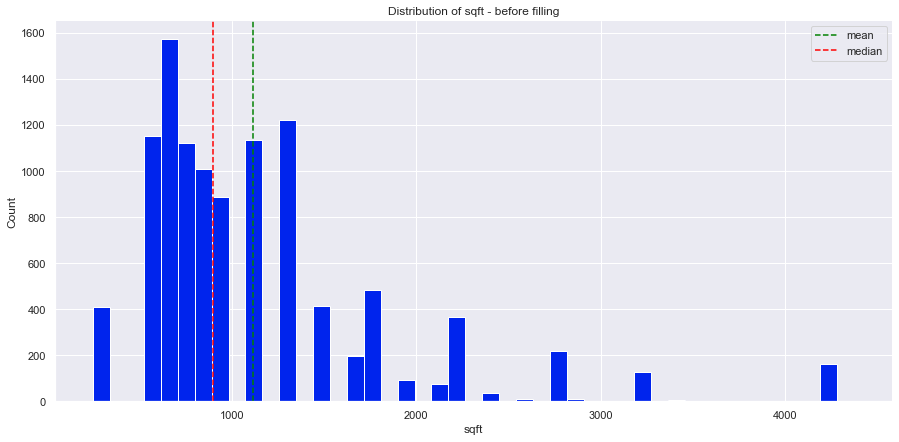

In [12]:
# set size of figure
plt.figure(figsize=(15, 7))
# plot only sqft column based on number of occurances
plt.hist(houses["sqft"], bins=45)

# plot mean and median lines
plt.axvline((houses["sqft"].mean()), color = "green",linestyle="--", label="mean")
plt.axvline((houses["sqft"].median()), color="Red", linestyle="--", label="median")

# set title and axis labels 
plt.title("Distribution of sqft - before filling")
plt.ylabel('Count')
plt.xlabel("sqft")
# remove graph boarders
sns.despine()
# add legend and show graph 
plt.legend()
plt.show()

It appears most listed homes appear to lie around 1000 sqft. From this graph it appears beneficial to fill the NA values with median as the distribution appears to be right skew

In [13]:
sqft_median = clean_houses['sqft'].median() # this number is 900
clean_houses.loc[:, "sqft"] = houses.loc[:, "sqft"].fillna(sqft_median) # fill empty lat cells with median

Check distributions after cleaning to make sure fill hasnt skewed the data too much 

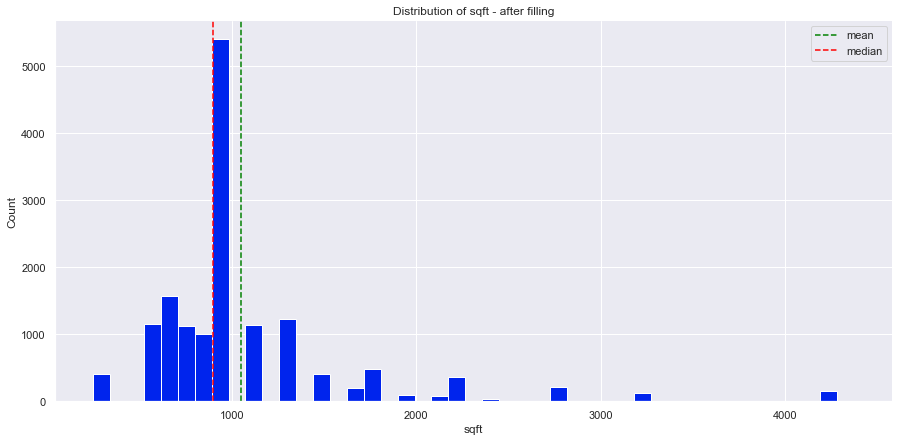

In [14]:
# set size of figure
plt.figure(figsize=(15, 7))
# plot only sqft column based on number of occurances
plt.hist(clean_houses["sqft"], bins=45)

# plot mean and median lines
plt.axvline((clean_houses["sqft"].mean()), color = "green",linestyle="--", label="mean")
plt.axvline((clean_houses["sqft"].median()), color="Red", linestyle="--", label="median")

# set title and axis labels 
plt.title("Distribution of sqft - after filling")
plt.ylabel('Count')
plt.xlabel("sqft")
# remove graph boarders
sns.despine()
# add legend and show graph 
plt.legend()
plt.show()

Unfortunately the data has been skewed, so I attempt a new method of filling na values based on `type` via checking the average sqft of that `type` and fill in the values

In [15]:
# re instantiate the null values using houses.copy since we havent altered other columns yet
clean_houses = houses.copy()

Check the number of counts for each 

In [16]:
clean_houses['type'].value_counts()

Condo Apt             7572
Detached              4361
Semi-Detached         1435
Condo Townhouse       1062
Att/Row/Twnhouse       467
Comm Element Condo     181
Plex                    70
Link                    27
Co-Ownership Apt        27
Co-Op Apt               24
Store W/Apt/Offc         8
Name: type, dtype: int64

Take grab a list of sqft values for each type

In [17]:
clean_houses.groupby(houses['type']).mean()['sqft']

type
Att/Row/Twnhouse     1856.306
Co-Op Apt             919.750
Co-Ownership Apt      688.889
Comm Element Condo    766.298
Condo Apt             852.655
Condo Townhouse      1283.294
Detached             2310.148
Link                 1586.364
Plex                 2494.444
Semi-Detached        1761.821
Store W/Apt/Offc     2750.000
Name: sqft, dtype: float64

Run a for loop for each type of home and fill the null values based on the mean sqft of that home type

In [18]:
for types in clean_houses['type'].value_counts().index:
    
    clean_houses['sqft'] = np.where(clean_houses.type.eq(types) & clean_houses.sqft.isnull(), 
                                    clean_houses.groupby(houses['type']).mean()['sqft'][types], 
                                    clean_houses.sqft)

Check our results on the plot made earlier.

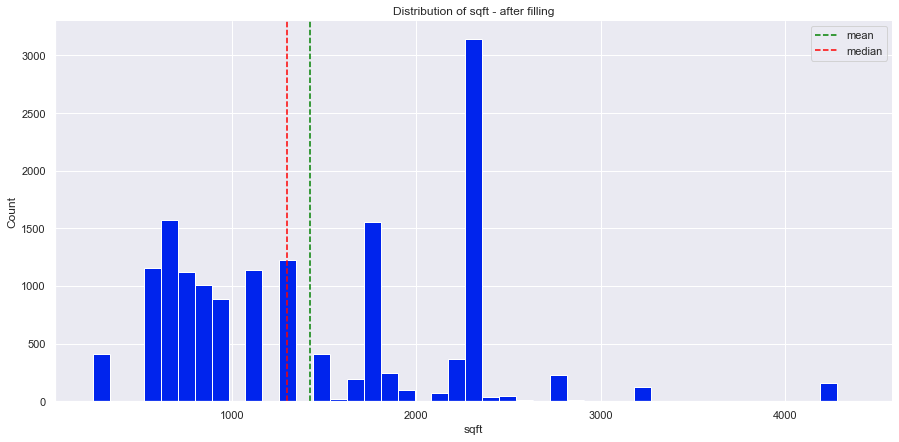

In [19]:
# set size of figure
plt.figure(figsize=(15, 7))
# plot only sqft column based on number of occurances
plt.hist(clean_houses["sqft"], bins=45)

# plot mean and median lines
plt.axvline((clean_houses["sqft"].mean()), color = "green",linestyle="--", label="mean")
plt.axvline((clean_houses["sqft"].median()), color="Red", linestyle="--", label="median")

# set title and axis labels 
plt.title("Distribution of sqft - after filling")
plt.ylabel('Count')
plt.xlabel("sqft")
# remove graph boarders
sns.despine()
# add legend and show graph 
plt.legend()
plt.show()

**Findings**
This data is revealing that a lot of nan values appear to have been filled with 2310 sqft meaning most of the missing data were from `detatched` homes.  

Move onto the next column containing na values being `description` which we fill with 'No description' since it would not make sense  to make one up for the 

In [20]:
clean_houses.loc[:, "description"] = clean_houses.loc[:, "description"].fillna('No description')

Now that all null values have been dealt with, proceed with the EDA or grasping a better understanding of the data overall

---
## Basic_EDA
### Utilize Pandas Profiling for extracting general information regarding the dataset

Through using padas profiling, this report can extract basic data what will be used for analysis from column:

- missing data points (cleaned earlier)
- distribution of values
    - Max/Min
    - Mean/Median
    - Standard deviation
- correlation heat map 
- unique values 
- numeric vs categorical

Note: Pandas Profiling also provides most used words and characters which may be useful for NLP

---

In [21]:
import pandas_profiling

In [22]:
clean_houses.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

After taking a look at the description results, findings from examining each column:

`title`
- all values are unique so no homes were sold more than once

`final_price`
- 2961 unique prices
- prices are right skew with a median of 715,000 and mean of 882,713
- most expensive sold 13,180,000
- least expensive sold 103,000

`list_price`
- 2267 disctinct prices
- prices are right skew with a median of 699,900 abd neab of 875,093
- Most expensive listing 13,180,000
- Least expensive listing 104,900

`bedrooms`
- broken down to single number or 2 seperate numbers (n+m) as basement vs above ground
- most homes are 2 or 3 bedrooms
- most homes that have a basement only have 1 bedroom above and below ground
- it can be assumed that condo units will not have seperate (n+m) values

`bathrooms`
- hard right skew with most homes having 1 or 2 bathrooms
- 1 bathroom homes make up 30.4% of the data
- 2 bathroom homes make up 44.3% of the data
- maximum bathrooms are 2 home with 14 bathrooms (wow)

`sqft`
- 33 distinct sqft values 
- median of 1300 and mean of 1424
- minimum of 250 and maximum of 4374 
- non-normal distribution with 2 peaks at mean/median and 2310 (filled values from earlier)
- 2310 makes up 20.6% of the total values which is slightly concerning considering they are filled values
    - may need to revisit this point when doing further analysis
- 2nd and 3rd most (1st and 2nd non filled) are 650 and 1300.
    - 650 is likely to be a condo unit
    - 1300 is likely to be a house unit

`parking`
- 12 disrinct values
- right skew distribution
- 53.7% of the homes have 1 parking spot and 17.8% have 2
- minimum of 0 and maximum of 11 (16 homes can fit 11 cars, wow)

`description`
- 49 homes had no description (filled from earlier)
- a small handful of homes had the same description. This is likely to be a result of similar style units with the same agent/company representing it
- average length (number of characters) is 401 and median of 434
    - descriptions are mostly a few sentences long.
- wordcount does not appear to filter for stop words (spaces, to, and, the, etc) so further NLP analysis will need to be conducted later

`MLS`
- all values are unique
- all values contain the same number of characters

`type`
- 11 distinct homes types
- condos represent nearly 50% of the data
- Detached represent 28.6% of the data
- Semi-Detached only 9.4% 
- strong drop off as Condo/Townhouse 7%, att/Row/twnhouse 3.1%, Comm Element Condo, 1.2%...
    - May break these values to Condo vs House later for log reg

`full_link`
- all unique

`full_address`
- 8831 unique
- duplicate rows imply condos at the same address but different unit

`lat`
- 8482 distinct values
- duplicates implies neighbours/closely spaced houses or different condo units
- slight right skew
- median 43.690963 mean 43.702658

`long`
- 8191 disctint values
- duplicates implies neighbours/closely spaced houses or different condo units
- appears normally distributed
- mean -79.394666 and median -79.395589

`city_district` and `district_code`
- 140 different areas around the city
- majority are in the Waterfront Comminuties-The Island
- more evenly distributed with a few outliers

`mean_district_income`
- 140 distinct values (1 for each district)
- right skew with large majority between 35000 and 65000
- mean of 56065.643 median income is 50580 
    - representing average salary of people who purchases property in 2017
- highest average income was 308010 lowest is 25989

`final_price_transformed`
- normally distributed transformation of the final_price column
- scalar was implemented
- Boxcox transformer was implemented

`final_price_log`
- calculated via np.log(houses[`average_income`])
- creates a more normal but right skewed distribution

`bedrooms_ag`
- lists bedrooms that are above ground 
- 10 distinct values (0-9)
- right skew with data concentrated between 1 and 3 (~85% of the data points)

`bedrooms_bg`
- lists bedrooms below ground 
- 7 distonct values (0-6)
- strong right skew with 93% of the data being 0 and 1
    - makes sense since most place are already condos with no basement and house basements are usually smaller than the above ground area

Take a look at some listings as a sudo sanity check

<tr>
<td> <img src="img/C4466546_1.JPG" alt="Drawing"  /> </td>
<td> <img src="img/C4423456.JPG" alt="Drawing"  /> </td>
</tr>

<tr>
<td> <img src="img/C4333829.JPG" alt="Drawing"  /> </td>
<td> <img src="img/C4511555.JPG" alt="Drawing"  /> </td>
</tr>

---
## Advanced_Exploratory_Data_Analysis

Exploring the data to gather insight on the following:

- Relationship between `final_price` and `mean_district_income`
- Relationship between `final_price` and `sqft`
- Relationship between `final_price` and `city_district`/`district_code`
- Does the `type` of home affect any of these factors?

- What affects housing more? Location / House features / Income ?

---

If you look for measuring relationship between variables and significance:
- numeric vs numeric: Pearson correlation (and Pearson R test);
- numeric vs binary categorical: 2-sample t-test;
- numeric vs multiple categories: ANOVA;
- category vs category: chi2 test on the crosstab.

## final_price_and_mean_district_income

Plot relationship between `mean_district_income` and `final_price` further grouped by  

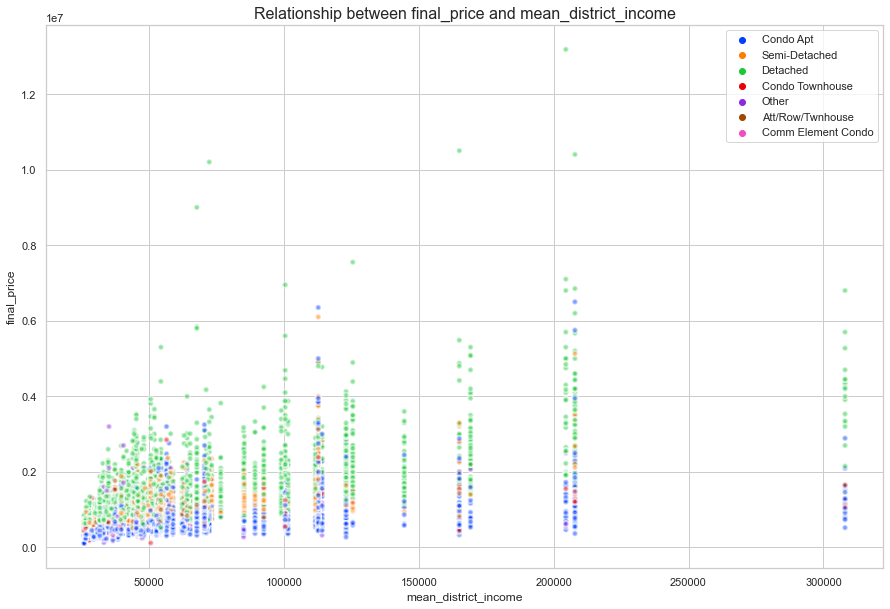

In [23]:
sns.set_style("whitegrid")

plt.figure(figsize=[15,10])
# plt.subplot(2,2,2)
sns.scatterplot(x='mean_district_income', y= 'final_price',data=clean_houses,
                linewidth=2, alpha=0.5, palette='bright', s=30, hue=houses.type.replace({                   
                    'Plex': 'Other',
                    'Link': 'Other',
                    'Co-Ownership Apt': 'Other',
                    'Co-Op Apt': 'Other',
                    'Store W/Apt/Offc': 'Other'}))


plt.legend()
plt.title('Relationship between final_price and mean_district_income', fontsize=16)
plt.show()

Plotly variant for interactivity

In [24]:
fig = px.scatter(clean_houses, x='mean_district_income', y='final_price', 
                 color=houses.type.replace({                   
                    'Plex': 'Other',
                    'Link': 'Other',
                    'Co-Ownership Apt': 'Other',
                    'Co-Op Apt': 'Other',
                    'Store W/Apt/Offc': 'Other'}))
fig.show()

In [25]:
clean_houses['mean_district_income'].value_counts().head(10)

70600    1148
70623     533
54438     523
45326     453
52787     417
53583     385
56526     276
29573     254
57039     232
52035     216
Name: mean_district_income, dtype: int64

In [26]:
clean_houses['mean_district_income'].value_counts().tail(10)

70831    31
44557    31
37108    31
85099    30
32648    30
50757    26
31383    24
32815    23
31800    17
33829    17
Name: mean_district_income, dtype: int64

#### Findings:

From the data outlining final price vs average disctrict income it can be concluded that while a majority of less expensive homes (under 400,000 (0.4 x 10^7)) are districts with lower average income, as the average income increases, the range of pricing also increases with higher priced houses generally being more expensive than houses. 

## final_price_and_sqft
#### Relationship_between `final_price` and `sqft`

Similar scatter plot as the previous comparison

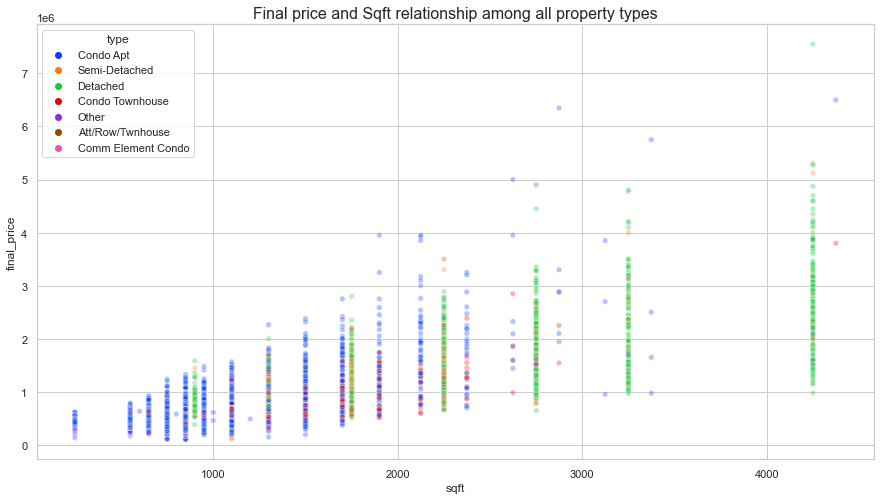

In [27]:
plt.figure(figsize=[15,8])
sns.scatterplot(x='sqft', y='final_price' ,data=houses, 
                hue = houses.type.replace({                   
                    'Plex': 'Other',
                    'Link': 'Other',
                    'Co-Ownership Apt': 'Other',
                    'Co-Op Apt': 'Other',
                    'Store W/Apt/Offc': 'Other'}),
                    linewidth=1, alpha=0.3, palette='bright', s=30)
plt.title('Final price and Sqft relationship among all property types', fontsize=16)
plt.show()

#### Findings:

- Condos tend to have a smaller sqft 
- sqft appears to be fixed or rounded values across homes 
    - datapoints are grouped in a vertical line formation
- Price ranges appear to increase with sqft

Despite the more expensive homes tending to be more expensive (higher pricing range) the minimum `final_price` values doesnt appear to change as much similar to the relationship with district income.

## final_price_and_city_district/district_code
#### Relationship between `final_price` and `city_district`/`district_code`

Utilize the same scatterplot as earlier

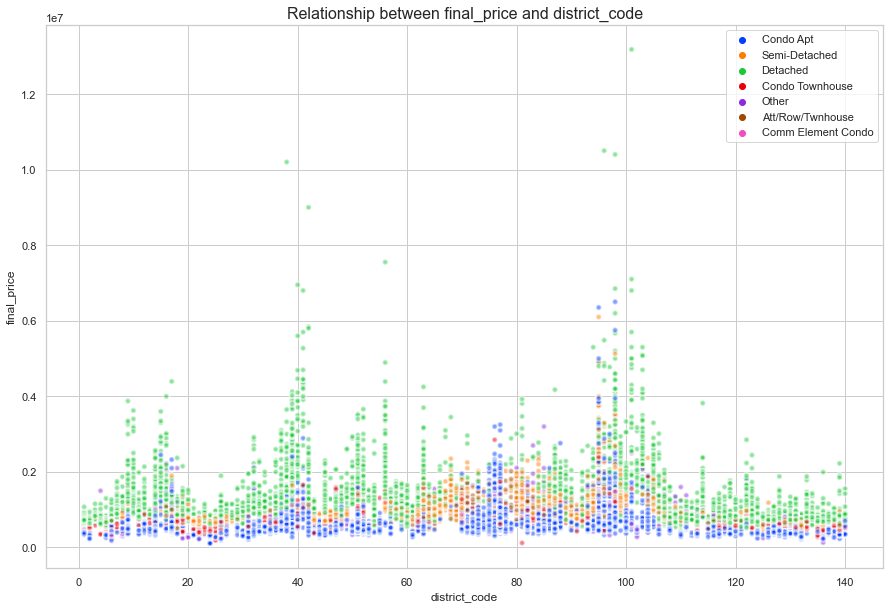

In [28]:
sns.set_style("whitegrid")

plt.figure(figsize=[15,10])
# plt.subplot(2,2,2)
sns.scatterplot(x='district_code', y= 'final_price',data=clean_houses,
                linewidth=2, alpha=0.5, palette='bright', s=30, hue=houses.type.replace({                   
                    'Plex': 'Other',
                    'Link': 'Other',
                    'Co-Ownership Apt': 'Other',
                    'Co-Op Apt': 'Other',
                    'Store W/Apt/Offc': 'Other'}))


plt.legend()
plt.title('Relationship between final_price and district_code', fontsize=16)
plt.show()

It appears that `disctrict_code` is more a categorical column as it maps 1:1 with `city_district` thus we switch the approach to using a bargraph which can be sorted to see what the most expensive city_districts are 

Find average `final_price` per `city_district`

In [29]:
avg_price_by_district = clean_houses.groupby(['city_district'])['final_price'].mean().round(decimals = 7)
avg_price_by_district

city_district
Agincourt North                 680524.528
Agincourt South-Malvern West    563194.927
Alderwood                       940140.750
Annex                          1595987.438
Banbury-Don Mills              1026008.228
                                   ...    
Wychwood                       1241481.145
Yonge-Eglinton                 1261030.508
Yonge-St.Clair                 1446948.403
York University Heights         601008.517
Yorkdale-Glen Park              651811.058
Name: final_price, Length: 140, dtype: float64

> Average `final_price` per `city_district` listed alphabetically

Sort new series in descending order for sanity check

In [30]:
avg_price_by_district.sort_values(ascending=False)

city_district
Forest Hill South                   2730345.360
Rosedale-Moore Park                 2331391.758
Bridle Path-Sunnybrook-York Mills   2327295.816
Lawrence Park South                 2137630.045
St.Andrew-Windfields                1967904.528
                                        ...    
Taylor-Massey                        518571.607
Malvern                              489511.433
Mount Olive-Silverstone-Jamestown    478181.250
Black Creek                          465673.096
Flemingdon Park                      433176.333
Name: final_price, Length: 140, dtype: float64

> Output is the top/bottom 5 `city_districts` by average `final_price`

Plot the bottom 5 `city_districts` by average `final_price`

<AxesSubplot:xlabel='city_district', ylabel='average_price'>

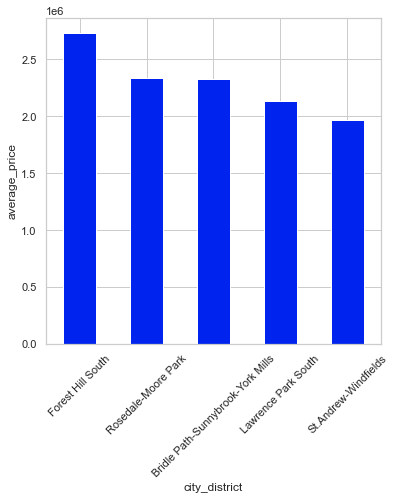

In [31]:
avg_price_by_district.sort_values(ascending=False).head(5).plot(kind = 'bar', 
                        figsize = (6,6),xlabel = 'city_district',ylabel = 'average_price', rot = 45)


> The highest average priced home districts are 
>
>     1. Forest Hill South 2,730,345
>     2. Rosedale-Moore Park 2,331,391
>     3. Bridle Path-Sunnybrook-York Mills 2,327,295
>     4. Lawrence Park South 2,137,630
>     5. St.Andrew-Windfields 1,967,904


Plot the bottom 5 `city_districts` by average `final_price`

<AxesSubplot:xlabel='city_district', ylabel='average_price'>

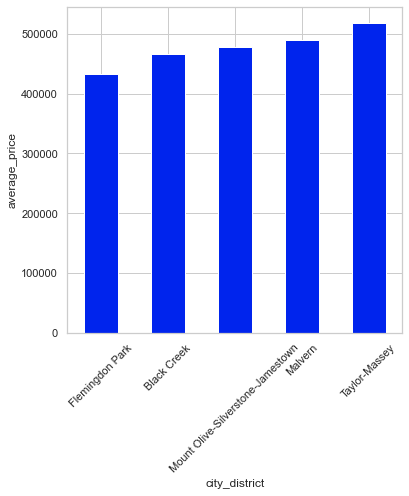

In [32]:
avg_price_by_district.sort_values(ascending=True).head(5).plot(kind = 'bar', 
                        figsize = (6,6),xlabel = 'city_district',ylabel = 'average_price', rot = 45)

> The lowest average priced home districts are 
>
>     1. Flemingdon Park 433,176
>     2. Black Creek 465,673
>     3. Mount Olive-Silverstone-Jamestown 478,181
>     4. Malvern 489,511
>     5. Taylor-Massey 518,571



Analyze mean_district_income by district via bokeh map

In [33]:
import geopandas as gpd

## Data_Wrangling

To wrangle categorical columns: 

- title: drop
- bedrooms: take sum of the columns `bedrooms_bg` and `bedrooms_ag` as `total_bedrooms`
- description: drop (possibly use for NLP later)
- mls: drop or possibly remove the first character
- type: group into binary (house: 1, other: 0)
- full_link: drop
- full_address: drop
- city_district: dummy variables

Note:
- district_code: is numeric but is mapped categorically to city_district

Set the dataset to use for modelling starting with the numeric columns:

    final_price, list_price, bathrooms, parking, lat, long, mean_district_income, 
    bedrooms_ag, sqft
    
leave out
    
    final_price_transformed, final_price_log, district_code, bedrooms_bg to reduce colinearity 

In [34]:
processed_houses = clean_houses[['final_price','list_price','bathrooms','parking',
                                 'lat','long','mean_district_income','sqft', 'bedrooms_ag']]

In [35]:
processed_houses

,final_price,list_price,bathrooms,parking,lat,long,mean_district_income,sqft,bedrooms_ag
df_index,,,,,,,,,
0,855000,870000,2,1,43.662,-79.386,56526,850.000,2
1,885000,898000,2,6,43.647,-79.530,52787,1761.821,3
2,550000,549900,1,0,43.708,-79.397,57039,550.000,1
3,665000,600000,1,1,43.638,-79.414,70623,650.000,1
4,825513,839000,2,1,43.597,-79.510,44101,2310.148,2
...,...,...,...,...,...,...,...,...,...
17539,785000,799000,2,1,43.648,-79.393,70600,750.000,2
17540,1025000,998888,5,2,43.706,-79.263,36232,3250.000,5
17541,681000,650000,3,1,43.788,-79.160,54045,1856.306,3


#### Calculate `total_bedrooms`

In [36]:
processed_houses['total_bedrooms'] = clean_houses['bedrooms_ag'] + clean_houses['bedrooms_bg']
processed_houses

/var/folders/d6/37r_p_s1067g3x_wc_m_hkdr0000gn/T/ipykernel_5893/4111208471.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,final_price,list_price,bathrooms,parking,lat,long,mean_district_income,sqft,bedrooms_ag,total_bedrooms
df_index,,,,,,,,,,
0,855000,870000,2,1,43.662,-79.386,56526,850.000,2,3
1,885000,898000,2,6,43.647,-79.530,52787,1761.821,3,3
2,550000,549900,1,0,43.708,-79.397,57039,550.000,1,1
3,665000,600000,1,1,43.638,-79.414,70623,650.000,1,2
4,825513,839000,2,1,43.597,-79.510,44101,2310.148,2,2
...,...,...,...,...,...,...,...,...,...,...
17539,785000,799000,2,1,43.648,-79.393,70600,750.000,2,2
17540,1025000,998888,5,2,43.706,-79.263,36232,3250.000,5,5
17541,681000,650000,3,1,43.788,-79.160,54045,1856.306,3,3


#### Group `type` into binary (house: 1, other: 0)

In [37]:
house_map = clean_houses['type']
house_map.unique()

array(['Condo Apt', 'Semi-Detached', 'Detached', 'Condo Townhouse',
       'Plex', 'Att/Row/Twnhouse', 'Comm Element Condo', 'Link',
       'Co-Ownership Apt', 'Co-Op Apt', 'Store W/Apt/Offc'], dtype=object)

In [38]:
processed_houses['is_house'] = clean_houses['type']

house_list = ['Semi-Detached', 'Detached', 'Condo Townhouse', 'Plex', 'Link', 'Store W/Apt/Offc', 'Att/Row/Twnhouse']
condo_list = ['Condo Apt', 'Comm Element Condo', 'Co-Ownership Apt', 'Co-Op Apt']

for house in house_list:
    processed_houses['is_house'] =\
        np.where(processed_houses['is_house'] == house, 1, processed_houses['is_house'])

for condo in condo_list:
    processed_houses['is_house'] =\
        np.where(processed_houses['is_house'] == condo, 0, processed_houses['is_house'])


/var/folders/d6/37r_p_s1067g3x_wc_m_hkdr0000gn/T/ipykernel_5893/3579519264.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/d6/37r_p_s1067g3x_wc_m_hkdr0000gn/T/ipykernel_5893/3579519264.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/d6/37r_p_s1067g3x_wc_m_hkdr0000gn/T/ipykernel_5893/3579519264.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

In [39]:
processed_houses['is_house'].value_counts()

0    7804
1    7430
Name: is_house, dtype: int64

In [40]:
processed_houses = processed_houses.astype({'is_house':'int'})

#### Correlation map 

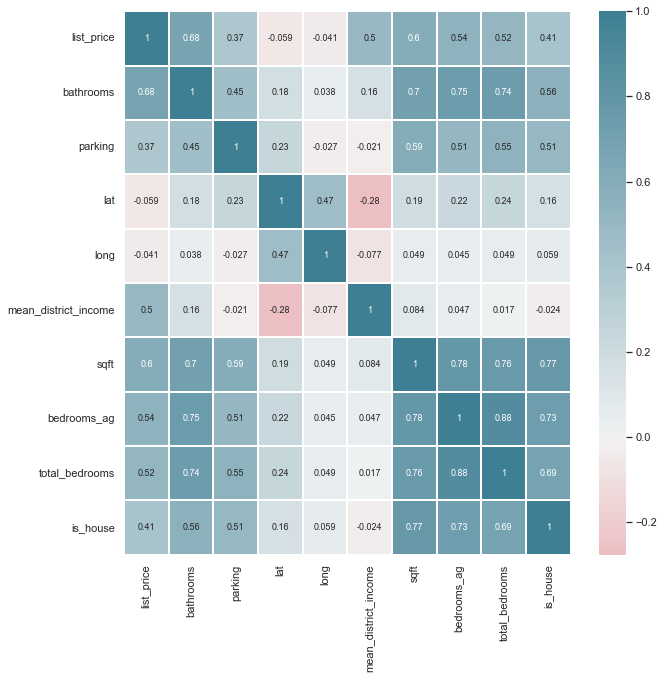

In [41]:
# Create features Heatmap to see how feature are correlated with final_price

def correlation_heatmap(df, center = None):
    fig, ax = plt.subplots(figsize = [10,10])
    colormap = sns.diverging_palette(10, 220, as_cmap=True)
    fig = sns.heatmap(df.corr(),
                cmap = colormap,
               center = center,
                annot = True,
                linewidths = 0.1,
                annot_kws={'fontsize':9})
    
    
correlation_heatmap(processed_houses.drop(columns = 'final_price'), center=0)

#### change `city_district` to dummy variables

In [42]:
clean_houses["city_district"].value_counts()

Waterfront Communities-The Island      1148
Niagara                                 533
Mimico (includes Humber Bay Shores)     523
Willowdale East                         453
Islington-City Centre West              417
                                       ... 
University                               26
Ionview                                  24
Thistletown-Beaumond Heights             23
Rustic                                   17
Beechborough-Greenbrook                  17
Name: city_district, Length: 140, dtype: int64

In [43]:
district_dummies = pd.get_dummies(clean_houses["city_district"], prefix="dist", drop_first=True)

In [44]:
district_dummies

,dist_Agincourt South-Malvern West,dist_Alderwood,dist_Annex,dist_Banbury-Don Mills,dist_Bathurst Manor,dist_Bay Street Corridor,dist_Bayview Village,dist_Bayview Woods-Steeles,dist_Bedford Park-Nortown,dist_Beechborough-Greenbrook,...,dist_Willowdale West,dist_Willowridge-Martingrove-Richview,dist_Woburn,dist_Woodbine Corridor,dist_Woodbine-Lumsden,dist_Wychwood,dist_Yonge-Eglinton,dist_Yonge-St.Clair,dist_York University Heights,dist_Yorkdale-Glen Park
df_index,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17540,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17541,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [45]:
processed_houses_w_dummies = pd.concat([processed_houses, district_dummies], axis=1)

In [46]:
processed_houses_w_dummies.head()

,final_price,list_price,bathrooms,parking,lat,long,mean_district_income,sqft,bedrooms_ag,total_bedrooms,...,dist_Willowdale West,dist_Willowridge-Martingrove-Richview,dist_Woburn,dist_Woodbine Corridor,dist_Woodbine-Lumsden,dist_Wychwood,dist_Yonge-Eglinton,dist_Yonge-St.Clair,dist_York University Heights,dist_Yorkdale-Glen Park
df_index,,,,,,,,,,,,,,,,,,,,,
0,855000,870000,2,1,43.662,-79.386,56526,850.000,2,3,...,0,0,0,0,0,0,0,0,0,0
1,885000,898000,2,6,43.647,-79.530,52787,1761.821,3,3,...,0,0,0,0,0,0,0,0,0,0
2,550000,549900,1,0,43.708,-79.397,57039,550.000,1,1,...,0,0,0,0,0,0,0,0,0,0
3,665000,600000,1,1,43.638,-79.414,70623,650.000,1,2,...,0,0,0,0,0,0,0,0,0,0
4,825513,839000,2,1,43.597,-79.510,44101,2310.148,2,2,...,0,0,0,0,0,0,0,0,0,0


## Linear_Regression

Slowly implement features into a linear regression model

In [47]:
y_d = processed_houses_w_dummies["final_price"]
X_d = processed_houses_w_dummies.drop(columns="final_price")

y = processed_houses["final_price"]
X = processed_houses.drop(columns="final_price")

y_d.shape, X_d.shape

((15234,), (15234, 149))

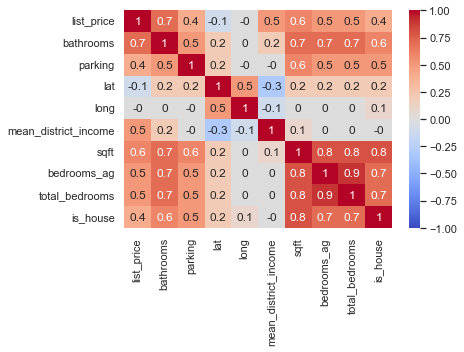

In [48]:
plt.figure()
sns.heatmap(X.corr().round(1), vmin=-1, vmax=1, cmap="coolwarm", annot=True)
plt.show()

In [49]:
from scipy import stats

In [50]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

pd.Series([variance_inflation_factor(X.values, i) 
               for i in range(X.shape[1])], 
              index=X.columns).sort_values(ascending=False)

lat                    240236.163
long                   240074.951
bedrooms_ag                30.267
total_bedrooms             27.110
sqft                       19.553
bathrooms                  14.618
list_price                  8.453
mean_district_income        6.208
is_house                    5.594
parking                     3.824
dtype: float64

In [51]:
X = processed_houses.drop(columns="final_price") # independent variable 
y = processed_houses["final_price"] # dependent variable

X_constant = sm.add_constant(X) # add constant
# Instantiate Model
pricing_lr1 = sm.OLS(y, X_constant)

# Fit Model
pricing_lr1_results = pricing_lr1.fit()

# Looking at the summary
pricing_lr1_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            final_price   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 9.583e+04
Date:                Mon, 12 Dec 2022   Prob (F-statistic):               0.00
Time:                        04:53:34   Log-Likelihood:            -1.9310e+05
No. Observations:               15234   AIC:                         3.862e+05
Df Residuals:                   15223   BIC:                         3.863e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 2.217e+07   1.04e+06     21.360      0.000    2.01e+07    2.42e+07
list_price               0.9359      0.002    553.050      0.000       0.933       0.939
bathrooms            -2801.4173   1000.025     -2.801      0.005   -4761.585    -841.249
parking              -8158.6486    608.429    -13.409      0.000   -9351.242   -6966.056
lat                   -3.45e+05   1.38e+04    -24.913      0.000   -3.72e+05   -3.18e+05
long                  8.926e+04   7573.257     11.786      0.000    7.44e+04    1.04e+05
mean_district_income     0.2826      0.024     11.610      0.000       0.235       0.330
sqft                     9.7292      1.717      5.667      0.000       6.364      13.094
bedrooms_ag           1.041e+04   1331.079      7.822      0.000    7802.704     1.3e+04
total_bedrooms        1669.5083   1020.985      1.635      0.102    -331.744    3670.761
is_house              3.497e+04   2133.365     16.394      0.000    3.08e+04    3.92e+04
==============================================================================
Omnibus:                     8092.983   Durbin-Watson:                   1.941
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           491924.657
Skew:                           1.768   Prob(JB):                         0.00
Kurtosis:                      30.613   Cond. No.                     1.79e+09
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.79e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Key takeaways:

- High R^2 value 0.983 meaning model fits well. Variation in y is explained with the model
- P values are all significant. Values are under 5% 
    - except total_bedrooms. This may be due to multicolinearity with bedrooms_ag
- Distribution of values may not be normal, 
    - check homoscedasticity: Variance of error terms are similar across the values of the independent variables
- Accept that there will be some multicolinearity
    - More sqft can mean more room for bedrooms/bathrooms
    - More sqft can imply unit is a house
    - List_price is very heavily correlated with Final_price so it will also have correlation with other columns

Equation for calculating lr is as follows: 
$$ y = 2.217e+07 + 0.9359 x_1 - 2801.4173 x_2 - 8158.6486 x_3 - 3.45e+05 x_4 + 8.926e+04 x_5 + 0.2826 x_6 + 9.7292 x_7 + 1.041e+04 x_8 + 1669.5083 x_9 + 3.497e+04 x_10 $$


Check columns that have low correlation with final_price and drop columns with little to no correlation

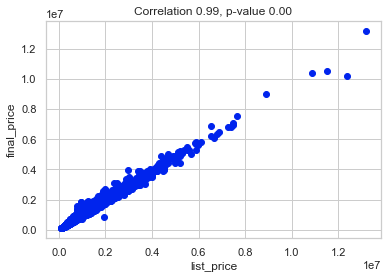

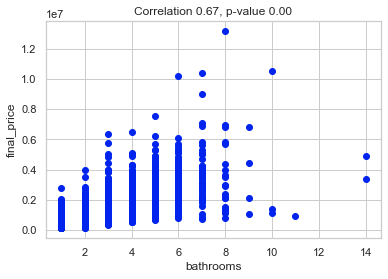

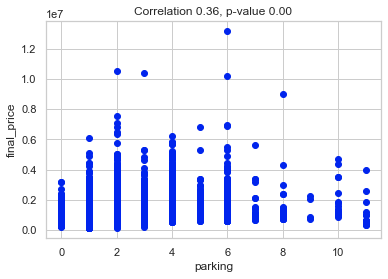

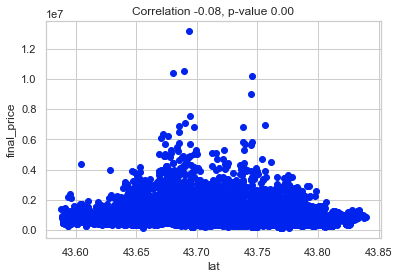

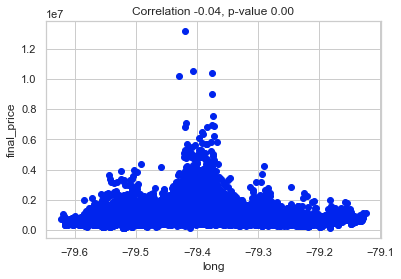

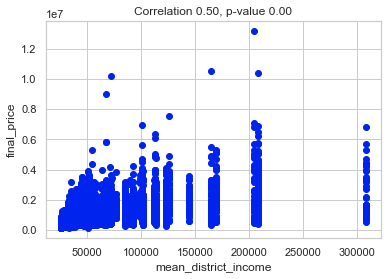

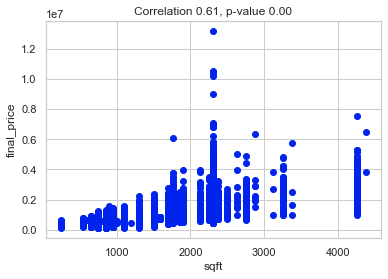

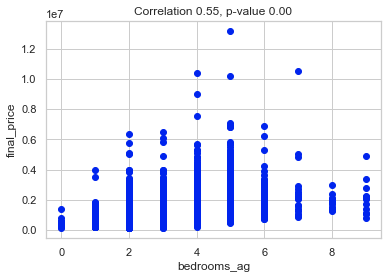

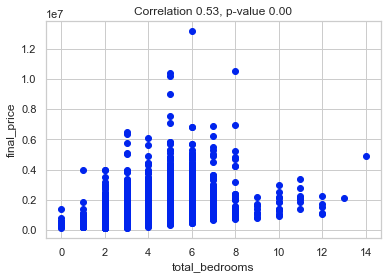

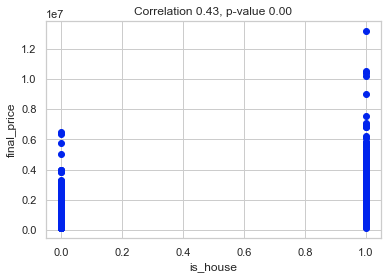

In [52]:
# using a loop to make plots for each column in X
for col in X.columns: 
    plt.figure()
    # scatter plot
    plt.scatter(X[col], y)
    plt.ylabel('final_price')
    plt.xlabel(col)
    
    # pearson R test
    corr, p_value = stats.pearsonr(X[col], y)
    plt.title(f"Correlation {corr:.2f}, p-value {p_value:.2f}")
    
    plt.show();

Drop `lat` and `long` along with `bedrooms_ag` (normally it would be `total_bedrooms` from the P value however there is multi-colinearity with bedrooms_ag and total_bedrooms is the better indicator as it describes more about the home).

In [53]:
X2 = X.drop(columns=["lat", "long", 'total_bedrooms'])

In [54]:
X_withconstant = sm.add_constant(X2)
# 1. Instantiate model
pricing_lr2 = sm.OLS(y, X_withconstant)

# 2. Fit model
pricing_lr2_results = pricing_lr2.fit()

pricing_lr2_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            final_price   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 1.315e+05
Date:                Mon, 12 Dec 2022   Prob (F-statistic):               0.00
Time:                        04:53:35   Log-Likelihood:            -1.9340e+05
No. Observations:               15234   AIC:                         3.868e+05
Df Residuals:                   15226   BIC:                         3.869e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.136e+04   2025.494      5.609      0.000    7390.750    1.53e+04
list_price               0.9415      0.002    551.495      0.000       0.938       0.945
bathrooms            -5088.6126    991.641     -5.132      0.000   -7032.347   -3144.878
parking              -1.097e+04    598.412    -18.328      0.000   -1.21e+04   -9794.489
mean_district_income     0.3907      0.024     16.043      0.000       0.343       0.438
sqft                     8.8121      1.744      5.053      0.000       5.394      12.230
bedrooms_ag           9127.3169   1071.320      8.520      0.000    7027.402    1.12e+04
is_house              4.008e+04   2164.618     18.514      0.000    3.58e+04    4.43e+04
==============================================================================
Omnibus:                     7993.376   Durbin-Watson:                   1.924
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           472981.099
Skew:                           1.741   Prob(JB):                         0.00
Kurtosis:                      30.074   Cond. No.                     4.13e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.13e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Key takeaways:

- High R^2 value 0.983 meaning model fits well. Variation in y is explained with the model
- Removed less meaningful numerical values
- P values are all significant. Values are under 5%
- Reduced multicollinearity with other numerical columns

Refined lr model is as follows
$$ y = 1.136e+04 + 0.9415 x_1 - 5088.6126 x_2 - 1.097e+04 x_3 + 0.3907 x_4 + 8.8121	x_5 + 9127.3169 x_6 + 4.008e+04 x_7 $$


Instead of removing more columns, the next step to improving the LR model is to check for normality.

First explore the distributions and normality of `final_price` and `mean_district_income`

Log transform is an excellent method to convert positively skewed data into normal, but here focused on automatic power conversion named Boxcox.

> A Box Cox transformation is a way to transform non-normal dependent variables into a normal shape. Normality is an important assumption for many statistical techniques; if your data isn’t normal, applying a Box-Cox means that you are able to run a broader number of tests.
The Box Cox transformation is named after statisticians George Box and Sir David Roxbee Cox who collaborated on a 1964 paper and developed the technique.

<center>The one-parameter Box–Cox transformations are defined as:</center>

<img src="img/boxcox.svg" alt="Drawing"/>

For more on [Boxcox Transformations](https://www.statisticshowto.com/probability-and-statistics/normal-distributions/box-cox-transformation/)

/var/folders/d6/37r_p_s1067g3x_wc_m_hkdr0000gn/T/ipykernel_5893/2854652194.py:5: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/d6/37r_p_s1067g3x_wc_m_hkdr0000gn/T/ipykernel_5893/2854652194.py:34: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/d6/37r_p_s1067g3x_wc_m_hkdr0000gn/T/ipykernel_5893/285

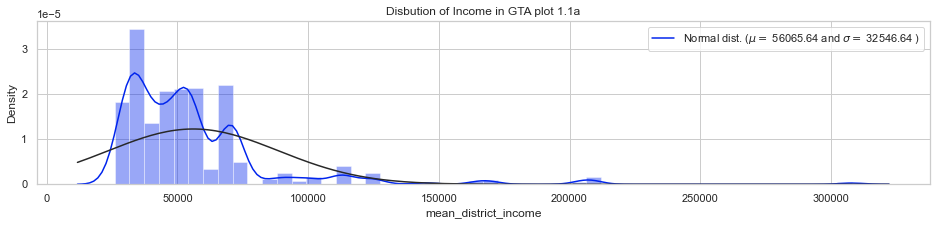

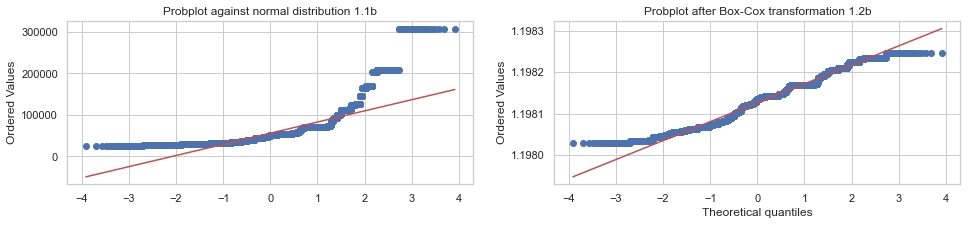

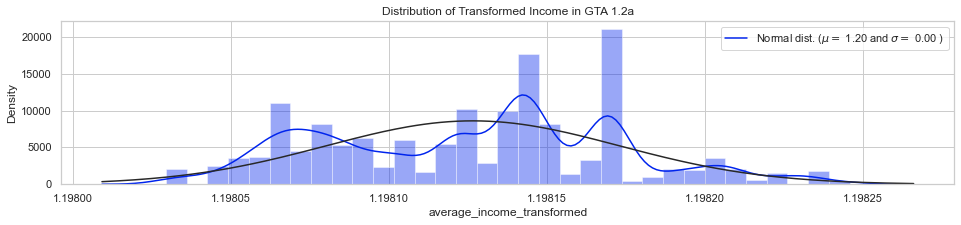

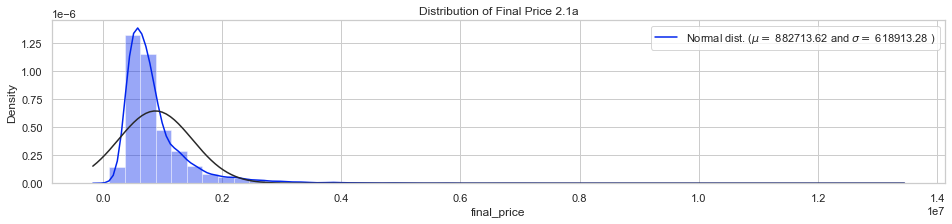

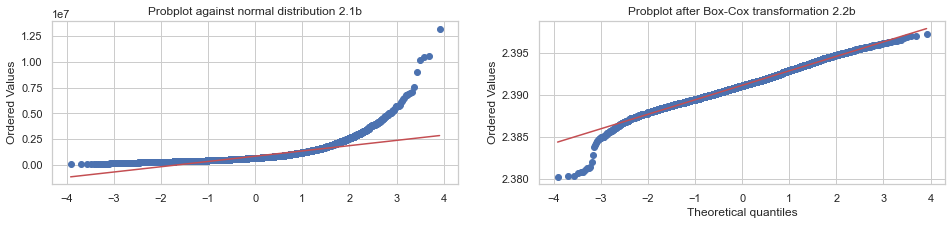

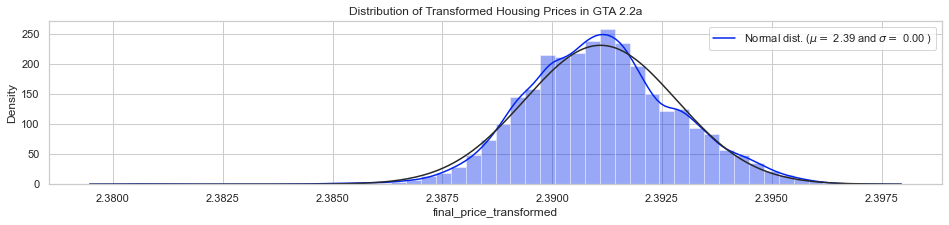

In [55]:
# plot distribution of mean district income
plt.figure(1, figsize=[16,3])
plt.subplots_adjust(hspace=0.4)
# plot distribution along with mu + sigma
sns.distplot(clean_houses['mean_district_income'], fit=stats.norm)
plt.title('Disbution of Income in GTA plot 1.1a')
# get mean (mu) and standard deviation (sigma)
(mu, sigma) = stats.norm.fit(houses['mean_district_income'])
# plot legend use regex to get mean and standard deviation
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')

# qq plot of mean_district_income
plt.figure(2, figsize=[16,3])
ax1=plt.subplot(1,2,1)
x = clean_houses['mean_district_income']
stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution 1.1b')

# qq plot of mean_districit_income after transformation
ax2=plt.subplot(1,2,2)
# use boxcox transformation
boxcox_lambda = stats.boxcox_normmax(x, brack=(-2.0, 2.0),  method='mle')
transformed_array = stats.boxcox(x, boxcox_lambda)
# To transform back
# np.exp(np.log(boxcox_lambda*transformed_array+1)/boxcox_lambda)
stats.probplot(transformed_array, dist=stats.norm , plot=ax2)
ax2.set_title('Probplot after Box-Cox transformation 1.2b')
clean_houses['average_income_transformed'] = transformed_array

# plot distribution of transformed average_income
plt.figure(3, figsize=[16,3])
sns.distplot(clean_houses['average_income_transformed'], fit=stats.norm)
plt.title('Distribution of Transformed Income in GTA 1.2a')
(mu, sigma) = stats.norm.fit(clean_houses['average_income_transformed'])
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')

# plot distribution of final price
plt.figure(4, figsize=[16,3])
sns.distplot(houses['final_price'], fit=stats.norm)
plt.title('Distribution of Final Price 2.1a')
(mu, sigma) = stats.norm.fit(houses['final_price'])
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')

# qq plot of final price
plt.figure(5, figsize=[16,3])
ax3=plt.subplot(1,2,1)
x = houses['final_price']
stats.probplot(x, dist=stats.norm, plot=ax3)
ax3.set_xlabel('')
ax3.set_title('Probplot against normal distribution 2.1b')

# qq plot of transformed final price
ax4=plt.subplot(1,2,2)
boxcox_lambda = stats.boxcox_normmax(x, brack=(-2.0, 2.0),  method='mle')
transformed_array = stats.boxcox(x, boxcox_lambda)
stats.probplot(transformed_array, dist=stats.norm , plot=ax4)
ax4.set_title('Probplot after Box-Cox transformation 2.2b')
clean_houses['final_price_transformed'] = transformed_array

# plot of transformed final price
plt.figure(6, figsize=[16,3])
sns.distplot(houses['final_price_transformed'], fit=stats.norm)
plt.title('Distribution of Transformed Housing Prices in GTA 2.2a')
(mu, sigma) = stats.norm.fit(houses['final_price_transformed'])
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')

plt.show()

Plotted distribution of `mean_district_income` (1.1a) to check for normality using a qq plot (1.1b)
> qq plot appears to skew around the head and tail so transform the values using boxcox and replot graphs
>
> Upon replotting the transformed values (1.2a), distribution to have normalized which can be seen in qq plot (1.2b)

From these results we can infer an issue with pricing in the GTA.

- Normalized housing prices are skewed slightly to the left however income appears normal. This means homes tend to be more expensive relative to income.  
- Income distribution is right skew. Infer that there is a rift between the median income and high income (wage gap).





Create new dataframe and apply transformations to all numerical columns

In [56]:
transformed_houses = pd.DataFrame()

transformed_houses['final_price_transformed'] = clean_houses['final_price_transformed']
transformed_houses['average_income_transformed'] = clean_houses['average_income_transformed']

x = clean_houses['list_price']
boxcox_lambda = stats.boxcox_normmax(x, brack=(-2.0, 2.0),  method='mle')
transformed_array = stats.boxcox(x, boxcox_lambda)
transformed_houses['list_price_transformed'] = transformed_array

x = clean_houses['parking'] + 1
boxcox_lambda = stats.boxcox_normmax(x, brack=(-2.0, 2.0),  method='mle')
transformed_array = stats.boxcox(x, boxcox_lambda)
transformed_houses['parking_transformed'] = transformed_array

x = clean_houses['sqft']
boxcox_lambda = stats.boxcox_normmax(x, brack=(-2.0, 2.0),  method='mle')
transformed_array = stats.boxcox(x, boxcox_lambda)
transformed_houses['sqft_transformed'] = transformed_array

x = processed_houses['total_bedrooms'] + 1
boxcox_lambda = stats.boxcox_normmax(x, brack=(-2.0, 2.0),  method='mle')
transformed_array = stats.boxcox(x, boxcox_lambda)
transformed_houses['total_bedrooms_transformed'] = transformed_array

x = processed_houses['bathrooms'] + 1
boxcox_lambda = stats.boxcox_normmax(x, brack=(-2.0, 2.0),  method='mle')
transformed_array = stats.boxcox(x, boxcox_lambda)
transformed_houses['bathrooms_transformed'] = transformed_array

transformed_houses['is_house'] = processed_houses['is_house']

In [57]:
processed_houses.head(1)

,final_price,list_price,bathrooms,parking,lat,long,mean_district_income,sqft,bedrooms_ag,total_bedrooms,is_house
df_index,,,,,,,,,,,
0,855000,870000,2,1,43.662,-79.386,56526,850.000,2,3,0


In [58]:
transformed_houses.head(1)

,final_price_transformed,average_income_transformed,list_price_transformed,parking_transformed,sqft_transformed,total_bedrooms_transformed,bathrooms_transformed,is_house
df_index,,,,,,,,
0,2.392,1.198,2.202,0.651,20.954,1.686,0.775,0


In [59]:
X = transformed_houses.drop(columns="final_price_transformed") # independent variable 
y = transformed_houses["final_price_transformed"] # dependent variable

X_constant = sm.add_constant(X) # add constant
# Instantiate Model
pricing_lr1 = sm.OLS(y, X_constant)

# Fit Model
pricing_lr1_results = pricing_lr1.fit()

# Looking at the summary
pricing_lr1_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     final_price_transformed   R-squared:                       0.982
Model:                                 OLS   Adj. R-squared:                  0.982
Method:                      Least Squares   F-statistic:                 1.163e+05
Date:                     Mon, 12 Dec 2022   Prob (F-statistic):               0.00
Time:                             04:53:36   Log-Likelihood:             1.0572e+05
No. Observations:                    15234   AIC:                        -2.114e+05
Df Residuals:                        15226   BIC:                        -2.114e+05
Df Model:                                7                                         
Covariance Type:                 nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -2.6662      0.065    -40.714      0.000      -2.795      -2.538
average_income_transformed     1.3681      0.059     23.116      0.000       1.252       1.484
list_price_transformed         1.5524      0.004    422.098      0.000       1.545       1.560
parking_transformed        -8.558e-05    6.4e-06    -13.375      0.000   -9.81e-05    -7.3e-05
sqft_transformed            7.076e-06   9.77e-07      7.243      0.000    5.16e-06    8.99e-06
total_bedrooms_transformed  2.157e-05   6.95e-06      3.105      0.002    7.95e-06    3.52e-05
bathrooms_transformed      -5.495e-05   2.14e-05     -2.570      0.010   -9.69e-05    -1.3e-05
is_house                       0.0001   6.33e-06     22.797      0.000       0.000       0.000
==============================================================================
Omnibus:                     4492.020   Durbin-Watson:                   1.917
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            19246.313
Skew:                           1.393   Prob(JB):                         0.00
Kurtosis:                       7.749   Cond. No.                     1.15e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.15e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R^2 value has not been affected that much compared to untransformed 

data coefficients
    
    - coef from 11360 to -2.68
    - mean_income from 0.39 to 1.38
    - list_price from 0.94 to 1.55
    - sqft from 8.81 to 0.000006594
    - bedrooms from 9127.31 to 0.00001594
    - bathrooms from -5088.61 to -0.00005495
    - parking from 10970 to -0.00008558
    

Check linear regression feature importance

Feature: 0, Score: 0.93586
Feature: 1, Score: -2801.41727
Feature: 2, Score: -8158.64864
Feature: 3, Score: -345021.55408
Feature: 4, Score: 89259.17087
Feature: 5, Score: 0.28260
Feature: 6, Score: 9.72920
Feature: 7, Score: 10411.77807
Feature: 8, Score: 1669.50831
Feature: 9, Score: 34974.31225


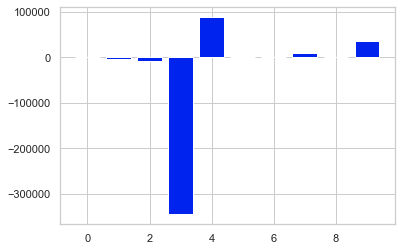

In [60]:
#from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot
# define dataset
y = processed_houses["final_price"]
X = processed_houses.drop(columns="final_price")
model = LinearRegression()
# fit the model
model.fit(X, y)
# get importance
importance = model.coef_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

#### Conclusions:
It appears that linear regression may not be the best when predicting housing prices. This is a result of the amount of multi colinearity within the columns. For example, sqft correlates heavily with bedrooms/bathrooms/parking as larger spaced living spaces tend to allocate that space for extra rooms and/or have more space for parking. Tune in to the following notebook for Machine Learning models that can better interpret this data.

Save resuls for advanced modeling in next notebook

In [61]:
processed_houses_w_dummies.to_csv('data/processed_houses_w_dummies.csv')
processed_houses.to_csv('data/processed_houses.csv')